In [1]:
"""
from google.colab import userdata
gh_token = userdata.get('GHPAT')

git_clone_command = f"git clone https://{gh_token}@github.com/HofstraDoboli/project-2-project2_team_epmt.git"

!{git_clone_command}

!pip install ucimlrepo
"""

'\nfrom google.colab import userdata\ngh_token = userdata.get(\'GHPAT\')\n\ngit_clone_command = f"git clone https://{gh_token}@github.com/HofstraDoboli/project-2-project2_team_epmt.git"\n\n!{git_clone_command}\n\n!pip install ucimlrepo\n'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd '/content/drive/MyDrive/AI/concrete_compressive_strength/'
%ls

/content/drive/MyDrive/AI/concrete_compressive_strength
Concrete_Data.xls  Concrete_Readme.txt  MyModels/  runs/


In [4]:
!pip install torch torchvision
!pip install tensorboard


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 53.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [5]:
import pandas as pd
import numpy as np
import torch as t
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data_utils
import matplotlib.pyplot as plt
import seaborn as sns
from   torch.autograd import Variable
from   torch.utils.tensorboard import SummaryWriter

In [6]:
# download the csv file as a pandas Dataframe
df_data = pd.read_excel('Concrete_Data.xls')
df_data.head()

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.296075


### Get data info

In [7]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Cement (component 1)(kg in a m^3 mixture)              1030 non-null   float64
 1   Blast Furnace Slag (component 2)(kg in a m^3 mixture)  1030 non-null   float64
 2   Fly Ash (component 3)(kg in a m^3 mixture)             1030 non-null   float64
 3   Water  (component 4)(kg in a m^3 mixture)              1030 non-null   float64
 4   Superplasticizer (component 5)(kg in a m^3 mixture)    1030 non-null   float64
 5   Coarse Aggregate  (component 6)(kg in a m^3 mixture)   1030 non-null   float64
 6   Fine Aggregate (component 7)(kg in a m^3 mixture)      1030 non-null   float64
 7   Age (day)                                              1030 non-null   int64  
 8   Concrete compressive strength(MPa, megapascals)  

In [8]:
df_data.describe()

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.165631,73.895485,54.187136,181.566359,6.203112,972.918592,773.578883,45.662136,35.817836
std,104.507142,86.279104,63.996469,21.355567,5.973492,77.753818,80.175427,63.169912,16.705679
min,102.000000,0.000000,0.000000,121.750000,0.000000,801.000000,594.000000,1.000000,2.331808
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.707115
50%,272.900000,22.000000,0.000000,185.000000,6.350000,968.000000,779.510000,28.000000,34.442774
75%,350.000000,142.950000,118.270000,192.000000,10.160000,1029.400000,824.000000,56.000000,46.136287
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.599225


### Get Correlation

In [9]:
df_data.corr()

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
Cement (component 1)(kg in a m^3 mixture),1.000000,-0.275193,-0.397475,-0.081544,0.092771,-0.109356,-0.222720,0.081947,0.497833
Blast Furnace Slag (component 2)(kg in a m^3 mixture),-0.275193,1.000000,-0.323569,0.107286,0.043376,-0.283998,-0.281593,-0.044246,0.134824
Fly Ash (component 3)(kg in a m^3 mixture),-0.397475,-0.323569,1.000000,-0.257044,0.377340,-0.009977,0.079076,-0.154370,-0.105753
Water (component 4)(kg in a m^3 mixture),-0.081544,0.107286,-0.257044,1.000000,-0.657464,-0.182312,-0.450635,0.277604,-0.289613
Superplasticizer (component 5)(kg in a m^3 mixture),0.092771,0.043376,0.377340,-0.657464,1.000000,-0.266303,0.222501,-0.192717,0.366102
Coarse Aggregate (component 6)(kg in a m^3 mixture),-0.109356,-0.283998,-0.009977,-0.182312,-0.266303,1.000000,-0.178506,-0.003016,-0.164928
Fine Aggregate (component 7)(kg in a m^3 mixture),-0.222720,-0.281593,0.079076,-0.450635,0.222501,-0.178506,1.000000,-0.156094,-0.167249
Age (day),0.081947,-0.044246,-0.154370,0.277604,-0.192717,-0.003016,-0.156094,1.000000,0.328877
"Concrete compressive strength(MPa, megapascals)",0.497833,0.134824,-0.105753,-0.289613,0.366102,-0.164928,-0.167249,0.328877,1.000000


In [10]:
columns_to_drop = [
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)',
    'Fly Ash (component 3)(kg in a m^3 mixture)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)'
]

df_data_select_train = df_data.drop(columns=columns_to_drop, inplace=False)
df_data_select_train.columns

Index(['Cement (component 1)(kg in a m^3 mixture)',
       'Water  (component 4)(kg in a m^3 mixture)',
       'Superplasticizer (component 5)(kg in a m^3 mixture)', 'Age (day)',
       'Concrete compressive strength(MPa, megapascals) '],
      dtype='object')

In [11]:
corr_values = df_data_select_train.corr()
sorted_corr = corr_values.loc[:,'Concrete compressive strength(MPa, megapascals) '].sort_values()
print(sorted_corr)
column_corr = list(sorted_corr.index)

Water  (component 4)(kg in a m^3 mixture)             -0.289613
Age (day)                                              0.328877
Superplasticizer (component 5)(kg in a m^3 mixture)    0.366102
Cement (component 1)(kg in a m^3 mixture)              0.497833
Concrete compressive strength(MPa, megapascals)        1.000000
Name: Concrete compressive strength(MPa, megapascals) , dtype: float64


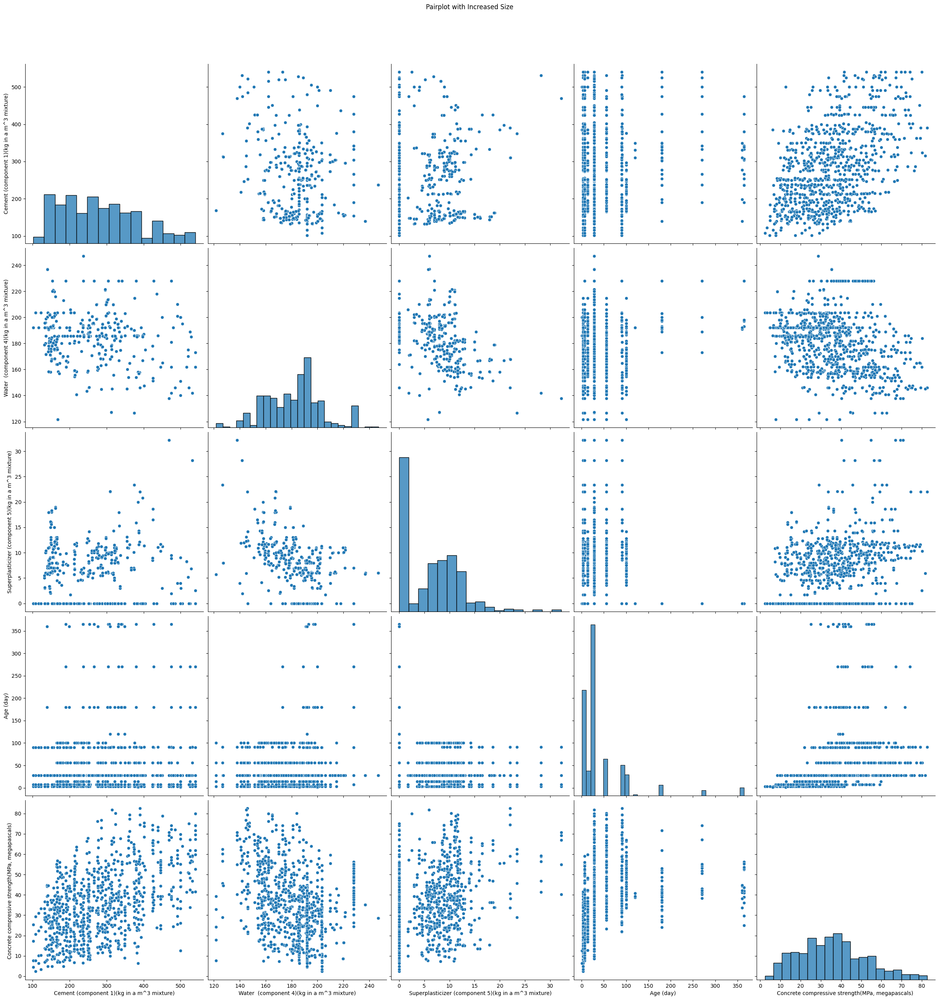

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt


sns.pairplot(df_data_select_train, height=5)
plt.suptitle('Pairplot with Increased Size', y=1.05)
plt.show()

In [13]:
y = t.tensor(df_data_select_train['Concrete compressive strength(MPa, megapascals) '].values,  dtype=t.float32)
y.dtype

torch.float32

In [14]:
x_numpy = df_data_select_train.iloc[:,:-1].to_numpy(dtype = float)
x_numpy.dtype
x = t.tensor(x_numpy, dtype = t.float32)
x.shape

torch.Size([1030, 4])

In [15]:
from sklearn.model_selection import train_test_split
# Split the data into a train and test set
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 123)

In [16]:
# scale the values
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

x_train_tensor = t.tensor(x_train_scaled, dtype = t.float32)
x_test_tensor = t.tensor(x_test_scaled, dtype = t.float32)

In [17]:
x_train_tensor.shape


torch.Size([824, 4])

In [18]:
y_train_tensor = t.log1p(y_train).reshape(-1,1)
y_test_tensor  = t.log1p(y_test).reshape(-1,1)

print(y_train_tensor.shape, type(y_train_tensor[1]))

torch.Size([824, 1]) <class 'torch.Tensor'>


In [19]:
train_data = [(x_train_tensor[i], y_train_tensor[i]) for i in range(x_train_tensor.shape[0])]
print("Sample train_data = ", train_data[:3], " type = ", type(train_data))
trainloader = t.utils.data.DataLoader(train_data, batch_size = 16, shuffle=True, num_workers=2, pin_memory=True)

test_data = [(x_test_tensor[i], y_test_tensor[i]) for i in range(x_test_tensor.shape[0])]
testloader = t.utils.data.DataLoader(test_data, batch_size = 8, num_workers=2, pin_memory=True)

Sample train_data =  [(tensor([-0.4012,  0.2048, -1.0451, -0.6116]), tensor([2.8149])), (tensor([ 0.1762, -0.8174,  1.1279, -0.2649]), tensor([3.6071])), (tensor([-0.2698, -1.6587,  1.0193,  0.1973]), tensor([3.8098]))]  type =  <class 'list'>


In [23]:
class ModelV1(nn.Module):
    def __init__(self, input_dim):

        super(ModelV1, self).__init__()
        self.layer1    = nn.Linear(in_features = input_dim, out_features = 30)
        #self.dropout1 = nn.Dropout(p = 0.3) # drop 30% of output nodes from the previous layer during training only
        self.layer2    = nn.Linear(in_features= 30, out_features = 10)
        #self.dropout2 = nn.Dropout(p = 0.25)
        self.layer3    = nn.Linear(in_features = 10, out_features = 1) # 1 neuron for revenue


    def forward(self, x):
        x = F.relu(self.layer1(x)) # activation function is RELU (rectified linear unit)
        #x = self.dropout1(x)
        x = F.relu(self.layer2(x))
        #x = self.dropout2(x)
        x = self.layer3(x) # linear outout neurons - output can be negative/positive
        return x

class ModelRegressionV2_Deeper(nn.Module):
    def __init__(self, input_dim):
        super(ModelRegressionV2_Deeper, self).__init__()
        self.linear1 = nn.Linear(in_features = input_dim, out_features = 30)
        self.linear2 = nn.Linear(in_features= 30, out_features=20)
        self.linear3 = nn.Linear(in_features= 20, out_features=10)
        self.linear4 = nn.Linear(in_features = 10, out_features = 1)

    def forward(self, x):
        x = F.relu(self.linear1(x)) # After 1st hidden layer
        x = F.relu(self.linear2(x)) # After 2nd hidden layer
        x = F.relu(self.linear3(x)) # After 3rd hidden layer
        x = self.linear4(x)         # Output
        return x

class ModelRegressionV3_Wider(nn.Module):
    def __init__(self, input_dim):
        super(ModelRegressionV3_Wider, self).__init__()
        self.linear1 = nn.Linear(in_features = input_dim, out_features = 50) # Wider layer
        self.linear2 = nn.Linear(in_features= 50, out_features=1)

    def forward(self, x):
        x = F.relu(self.linear1(x))
        x = self.linear2(x)
        return x



In [24]:
import copy
#Models

model_v1 = ModelV1(input_dim = x_train.shape[1])
model_v2 = ModelRegressionV2_Deeper(input_dim = x_train.shape[1])
model_v3 = ModelRegressionV3_Wider(input_dim = x_train.shape[1])




models = [model_v1, model_v2, model_v3]


loss_fn = nn.MSELoss() # loss function = MeanSquareError Loss
print(model_v1)
print(model_v2)
print(model_v3)

y0 = model_v1.forward(x_train[0,:])
print(y0)

# Print model's state_dict
print("Model's state_dict:")
for param_tensor in model_v1.state_dict():
    print(param_tensor, "\t", model_v1.state_dict()[param_tensor].size())

writer = SummaryWriter("/runs/concrete") # on the google drive


model_v1.__name__ = "ModelV1"
model_v2.__name__ = "ModelV2_Deeper"
model_v3.__name__ = "ModelV3_Wider"

model_v1.__name__

ModelV1(
  (layer1): Linear(in_features=4, out_features=30, bias=True)
  (layer2): Linear(in_features=30, out_features=10, bias=True)
  (layer3): Linear(in_features=10, out_features=1, bias=True)
)
ModelRegressionV2_Deeper(
  (linear1): Linear(in_features=4, out_features=30, bias=True)
  (linear2): Linear(in_features=30, out_features=20, bias=True)
  (linear3): Linear(in_features=20, out_features=10, bias=True)
  (linear4): Linear(in_features=10, out_features=1, bias=True)
)
ModelRegressionV3_Wider(
  (linear1): Linear(in_features=4, out_features=50, bias=True)
  (linear2): Linear(in_features=50, out_features=1, bias=True)
)
tensor([-0.2645], grad_fn=<ViewBackward0>)
Model's state_dict:
layer1.weight 	 torch.Size([30, 4])
layer1.bias 	 torch.Size([30])
layer2.weight 	 torch.Size([10, 30])
layer2.bias 	 torch.Size([10])
layer3.weight 	 torch.Size([1, 10])
layer3.bias 	 torch.Size([1])


'ModelV1'

In [28]:
model_constructors = {
    "ModelV1": lambda: ModelV1(input_dim=4),
    "ModelV2_Deeper": lambda: ModelRegressionV2_Deeper(input_dim=4),
    "ModelV3_Wider": lambda: ModelRegressionV3_Wider(input_dim=4)
}
optimizer_configs = {
    "Adam": t.optim.Adam,
    "SGD": t.optim.SGD
}
learning_rates = [0.01, 0.005, 0.02]

device = t.device("cuda" if t.cuda.is_available() else "cpu")

### Train the models (Already Completed)

In [29]:
"""

# --- Main Experimental Loop ---
experiment_results = {} # Use this for storing metrics
# model_storage = {} # Optional: if you want to store trained model objects
device = t.device("cuda" if t.cuda.is_available() else "cpu")
print("\n--- Starting Experimentation Loop ---")
for model_name, model_constructor in model_constructors.items():
    experiment_results[model_name] = {}
    for opt_name, OptimizerClass in optimizer_configs.items():
        experiment_results[model_name][opt_name] = {}
        for lr in learning_rates:
            print(f"\nEXPERIMENT: Model={model_name}, Optimizer={opt_name}, LR={lr}")

            # 1. Instantiate a fresh model for each experiment
            current_model = model_constructor()
            # device = t.device("cuda" if t.cuda.is_available() else "cpu") # Example device handling
            # current_model.to(device)
            # 2. Create the optimizer for this specific model instance and LR
            optimizer = OptimizerClass(current_model.parameters(), lr=lr)

            # 3. Train the model
            # Ensure train_model returns the trained model
            # Also ensure trainloader, testloader, loss_fn are correctly defined and passed
            # and that data is moved to the same device as the model if using GPU
            print(f"Training model: {model_name} with {opt_name} and LR={lr}...")
            trained_model = train_model(
                n_epochs=100,       # Or your desired number of epochs
                model=current_model,
                train_loader=trainloader, # Make sure trainloader is defined
                test_loader=testloader,
                optimizer=optimizer,
                loss_fn=loss_fn,      # Make sure loss_fn is defined
                # device=device       # Pass device if train_model supports it
            )
            print("Training complete.")

            # 4. Evaluate the trained model using your evaluate_model function
            print(f"Evaluating model: {model_name} with {opt_name} and LR={lr}...")
            # Ensure testloader and loss_fn are appropriate for evaluation


            # 5. Store the evaluation metrics
            experiment_results[model_name][opt_name][f"lr_{lr}"] = {
                'metrics': metrics_dict,
                'y_true': y_true_array,
                'y_pred': y_pred_array
            }

            # Define the base directory for your models
            models_base_dir = "/content/drive/MyDrive/AI/concrete_compressive_strength/MyModels/"

            # Ensure the directory exists 0.
            if not os.path.exists(models_base_dir):
                os.makedirs(models_base_dir)

            # Construct the full path for a specific model
            model_filename = f"{model_name}_{opt_name}_lr{lr}_statedict.pth"
            model_save_path = os.path.join(models_base_dir, model_filename)
            print(f"Model save path: {model_save_path}")
            # Save the model
            try:
                t.save(current_model.state_dict(), model_save_path)
                print(f"Saved trained model state_dict to {model_save_path}")
            except Exception as e:
                print(f"Error saving model {model_save_path}: {e}")

print("\n--- Experimentation Loop Complete ---")"""

'\n\n# --- Main Experimental Loop ---\nexperiment_results = {} # Use this for storing metrics\n# model_storage = {} # Optional: if you want to store trained model objects\ndevice = t.device("cuda" if t.cuda.is_available() else "cpu")\nprint("\n--- Starting Experimentation Loop ---")\nfor model_name, model_constructor in model_constructors.items():\n    experiment_results[model_name] = {}\n    for opt_name, OptimizerClass in optimizer_configs.items():\n        experiment_results[model_name][opt_name] = {}\n        for lr in learning_rates:\n            print(f"\nEXPERIMENT: Model={model_name}, Optimizer={opt_name}, LR={lr}")\n\n            # 1. Instantiate a fresh model for each experiment\n            current_model = model_constructor()\n            # device = t.device("cuda" if t.cuda.is_available() else "cpu") # Example device handling\n            # current_model.to(device)\n            # 2. Create the optimizer for this specific model instance and LR\n            optimizer = Optimi

In [30]:
writer.close()

In [31]:
%load_ext tensorboard
%tensorboard --logdir=runs # --bind_all --load_fast false # start tensorboard


<IPython.core.display.Javascript object>

In [32]:
def train_model(n_epochs, model, train_loader, test_loader, optimizer, loss_fn):

    last_val_loss = 100
    for epoch in range(n_epochs+1):
      model.train()       # set model in training mode = with dropout
      train_loss = 0.0
      total = 0

      for xb,yb in train_loader: # for each batch
        optimizer.zero_grad() # set gradients to 0

        ym   = model.forward(xb)
        loss = loss_fn(ym,yb) # compute the loss between ym = output of the model and yb = correct output
        loss.backward()       # compute the gradients

        # adds the weights of each later in the tensorboard
        for name, param in model.named_parameters():
          if param.grad is not None:
            writer.add_histogram(f"{name}.grad", param.grad, epoch)

        optimizer.step()      # adjust the weights according to the gradients and the learning rate

        # compute loss, predicted, total,
        train_loss += loss.item()* yb.size(0) # times the size of the batch - because it is already mean square

      train_loss = train_loss / len(train_loader)

      # 🧠 Log weights after update
      for name, param in model.named_parameters():
        writer.add_histogram(f"{name}.weight", param.data, epoch)

      writer.add_scalar("Loss/train", train_loss, epoch) # training loss
      #writer.add_scalar("Accuracy/train", acc, epoch)

      if epoch == 1 or epoch % 5 == 0:
        model.eval() # set model in evaluation mode = no dropout

        val_loss = 0.0

        with t.no_grad():  # no learning
          for xb,yb in test_loader: # for each batch
            ym_val   = model.forward(xb)
            loss_val = loss_fn(ym_val,yb)


            val_loss += loss_val * yb.size(0)


          val_loss = val_loss / len(test_loader)

          writer.add_scalar("Loss/val", val_loss, epoch) # training loss
          #writer.add_scalar("Accuracy/val", val_acc, epoch)

          print(f"Epoch {epoch}, Training loss {train_loss:.4f},", end = " ")
          print(f" Validation loss {loss_val.item():.4f}")
          #if last_val_loss < loss_val:
          #  print("Early stopping at epoch", epoch)
          #  return
          #last_val_loss = loss_val
    print("Training complete.")

In [33]:
import torch as t
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def evaluate_model(model, testloader, loss_fn):
    model.eval()

    y_pred_list = []  # To store predictions from each batch
    y_true_list = []  # To store true labels from each batch

    val_loss = 0.0  # Initialize total validation loss


    with t.no_grad():
        for xb, yb in testloader:  # Iterate over each batch in the testloader


            ym_val = model.forward(xb)  # Get model predictions for the current batch
            loss_val_batch = loss_fn(ym_val, yb) # Calculate loss for the current batch
            val_loss += loss_val_batch.item() * yb.size(0) # Accumulate weighted loss


            y_pred_list.append(ym_val.squeeze().cpu())
            y_true_list.append(yb.squeeze().cpu())

    # Calculate average validation loss across all batches
    if len(testloader.dataset) > 0: # Check to avoid division by zero if dataset is empty
        val_loss = val_loss / len(testloader.dataset)
    else:
        val_loss = 0.0

    print(f"Average Validation Loss: {val_loss:.4f}")

    # Concatenate all batch predictions and true labels into single tensors
    y_pred_log = t.cat(y_pred_list)
    y_true_log = t.cat(y_true_list)


    y_pred_numpy = t.expm1(y_pred_log).numpy()
    y_true_numpy = t.expm1(y_true_log).numpy()

    # Compute error metrics using scikit-learn
    mse = mean_squared_error(y_true_numpy, y_pred_numpy)
    rmse = np.sqrt(mse)  # RMSE is the square root of MSE
    mae = mean_absolute_error(y_true_numpy, y_pred_numpy)
    r2 = r2_score(y_true_numpy, y_pred_numpy)

    # Print the calculated metrics
    print(f"Test MSE : {mse:.4f}")
    print(f"Test RMSE: {rmse:.4f}")
    print(f"Test MAE : {mae:.4f}")
    print(f"Test R²  : {r2:.4f}")

    # Store metrics in a dictionary
    metrics = {
        'val_loss': val_loss,
        'mse': mse,
        'rmse': rmse,
        'mae': mae,
        'r2': r2
    }

    # Return the metrics dictionary, true values, and predicted values
    return metrics, y_true_numpy, y_pred_numpy



In [34]:
def plot_true_vs_predicted(y_true, y_pred, title_prefix=""):
    """
    Generates a scatter plot of true vs. predicted values.
    """
    if y_true is None or y_pred is None:
        print(f"  Skipping plot for '{title_prefix.strip()}': y_true or y_pred is None.")
        return
    if not isinstance(y_true, np.ndarray) or not isinstance(y_pred, np.ndarray):
        print(f"  Skipping plot for '{title_prefix.strip()}': y_true or y_pred is not a NumPy array.")
        return
    if y_true.size == 0 or y_pred.size == 0:
        print(f"  Skipping plot for '{title_prefix.strip()}': y_true or y_pred is empty.")
        return
    if y_true.shape != y_pred.shape:
        print(f"  Skipping plot for '{title_prefix.strip()}': y_true shape {y_true.shape} and y_pred shape {y_pred.shape} do not match.")
        return

    plt.figure(figsize=(7, 7))
    plt.scatter(y_true, y_pred, alpha=0.6, edgecolors='w', linewidth=0.5)
    min_val = min(y_true.min(), y_pred.min())
    max_val = max(y_true.max(), y_pred.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Ideal Fit')
    plt.xlabel('True Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    full_title = f'{title_prefix}True vs Predicted on Test Set'.strip()
    plt.title(full_title, fontsize=16) # Title fontsize was previously updated
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_all_experiment_results(experiment_results_dict): # Renamed arg to avoid conflict
    """
    Iterates through a (potentially nested) experiment_results dictionary and plots
    true vs. predicted values for each valid experiment run.
    """
    if not isinstance(experiment_results_dict, dict) or not experiment_results_dict:
        print("Experiment results are empty or not in the expected dictionary format.")
        return

    print("--- Generating True vs. Predicted Plots ---")
    for model_name, model_data in experiment_results_dict.items():
        if not isinstance(model_data, dict):
            print(f"Warning: Data for model '{model_name}' is not a dictionary. Skipping.")
            continue
        for opt_name, opt_data in model_data.items():
            if not isinstance(opt_data, dict):
                print(f"Warning: Data for optimizer '{opt_name}' (model '{model_name}') is not a dictionary. Skipping.")
                continue
            for lr_key, results_entry in opt_data.items():
                if not isinstance(results_entry, dict):
                    print(f"Warning: Data for LR '{lr_key}' (model '{model_name}', opt '{opt_name}') is not a dictionary. Skipping.")
                    continue

                title_prefix = f"Model: {model_name}, Opt: {opt_name}, {lr_key}\n"
                y_true_array = results_entry.get('y_true')
                y_pred_array = results_entry.get('y_pred')

                if 'metrics' in results_entry and 'error' in results_entry['metrics']:
                    print(f"Skipping plot for {title_prefix.strip()}: Experiment had an error - {results_entry['metrics']['error']}")
                    continue

                plot_true_vs_predicted(y_true_array, y_pred_array, title_prefix)
    print("--- Plot Generation Complete ---")

In [35]:
import re
import os
models_base_dir = "/content/drive/MyDrive/AI/concrete_compressive_strength/MyModels/"
models_base_dir = "/content/drive/MyDrive/AI/concrete_compressive_strength/MyModels/"
evaluated_models_data = {} # To store results

print(f"\n--- Starting Evaluation of Saved Models from: {models_base_dir} ---")

# Try to retrieve each model from the fodler that was trained.
if not os.path.exists(models_base_dir):
    print(f"Directory {models_base_dir} does not exist. Please check the path or create it.")
else:
    for model_file_in_dir in os.listdir(models_base_dir):
        if model_file_in_dir.endswith("_statedict.pth"): # Process only .pth state_dict files
            print(f"\nProcessing model: {model_file_in_dir}")
            full_file_path = os.path.join(models_base_dir, model_file_in_dir)

            # Parse filename to get model_name, optimizer_name, and lr
            match = re.match(r"(ModelV1|ModelV2_Deeper|ModelV3_Wider)_(Adam|SGD)_lr(0\.\d+)_statedict\.pth", model_file_in_dir)
            if not match:
                print(f"  Could not parse filename: {model_file_in_dir}. Skipping.")
                continue

            model_name_from_file = match.group(1)
            opt_name_from_file = match.group(2)
            lr_from_file = float(match.group(3))

            print(f"  Identified: Model={model_name_from_file}, Optimizer={opt_name_from_file}, LR={lr_from_file}")

            if model_name_from_file not in model_constructors:
                print(f"  Unknown model architecture: {model_name_from_file}. Skipping.")
                continue

            # Instantiate the correct model architecture
            try:
                loaded_model_instance = model_constructors[model_name_from_file]()
            except Exception as e:
                print(f"  Error instantiating model {model_name_from_file}: {e}. Skipping.")
                continue # Skip to the next file if instantiation fails

            try:
                # Load the state_dict into the model instance
                state_dict = t.load(full_file_path, map_location=device)
                loaded_model_instance.load_state_dict(state_dict)
                loaded_model_instance.to(device) # Move model to the selected device
                loaded_model_instance.eval() # Set to evaluation mode
                print(f"  Successfully loaded model state_dict into {model_name_from_file} instance.")

                # Evaluate the loaded model instance
                print(f"  Evaluating: {model_name_from_file}, Opt: {opt_name_from_file}, LR: {lr_from_file}...")
                metrics_dict, y_true_array, y_pred_array = evaluate_model(
                    model=loaded_model_instance, # Pass the model instance here
                    testloader=testloader,
                    loss_fn=loss_fn,
                )

                # Store results for plotting
                key = f"{model_name_from_file}_{opt_name_from_file}_lr{lr_from_file}"
                evaluated_models_data[key] = {
                    'metrics': metrics_dict,
                    'y_true': y_true_array,
                    'y_pred': y_pred_array
                }
                print(f"  Evaluation complete for {model_file_in_dir}.")

            except Exception as e:
                print(f"  Error loading state_dict or evaluating model {model_file_in_dir}: {e}")
        else:
            print(f"\nSkipping non-model file or incorrect extension: {model_file_in_dir}")


--- Starting Evaluation of Saved Models from: /content/drive/MyDrive/AI/concrete_compressive_strength/MyModels/ ---

Processing model: ModelV1_Adam_lr0.01_statedict.pth
  Identified: Model=ModelV1, Optimizer=Adam, LR=0.01
  Successfully loaded model state_dict into ModelV1 instance.
  Evaluating: ModelV1, Opt: Adam, LR: 0.01...
Average Validation Loss: 0.0576
Test MSE : 104.8994
Test RMSE: 10.2420
Test MAE : 7.1997
Test R²  : 0.6178
  Evaluation complete for ModelV1_Adam_lr0.01_statedict.pth.

Processing model: ModelV1_Adam_lr0.005_statedict.pth
  Identified: Model=ModelV1, Optimizer=Adam, LR=0.005
  Successfully loaded model state_dict into ModelV1 instance.
  Evaluating: ModelV1, Opt: Adam, LR: 0.005...
Average Validation Loss: 0.0645
Test MSE : 75.7442
Test RMSE: 8.7031
Test MAE : 6.4173
Test R²  : 0.7240
  Evaluation complete for ModelV1_Adam_lr0.005_statedict.pth.

Processing model: ModelV1_Adam_lr0.02_statedict.pth
  Identified: Model=ModelV1, Optimizer=Adam, LR=0.02
  Successfu


Reformatting 18 entries for plotting...
--- Generating True vs. Predicted Plots ---


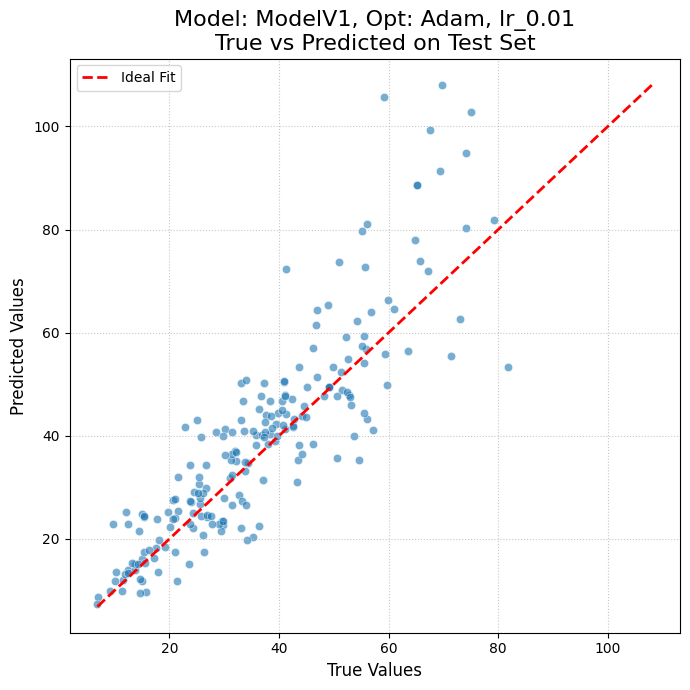

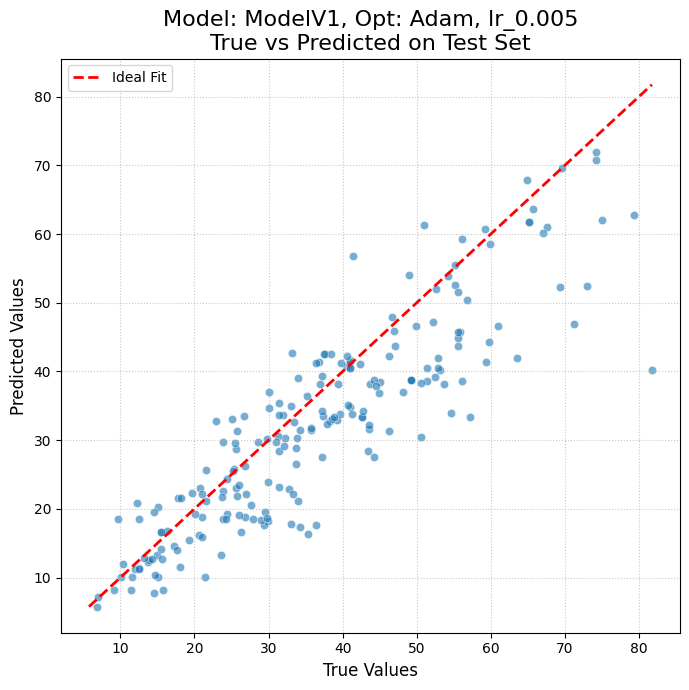

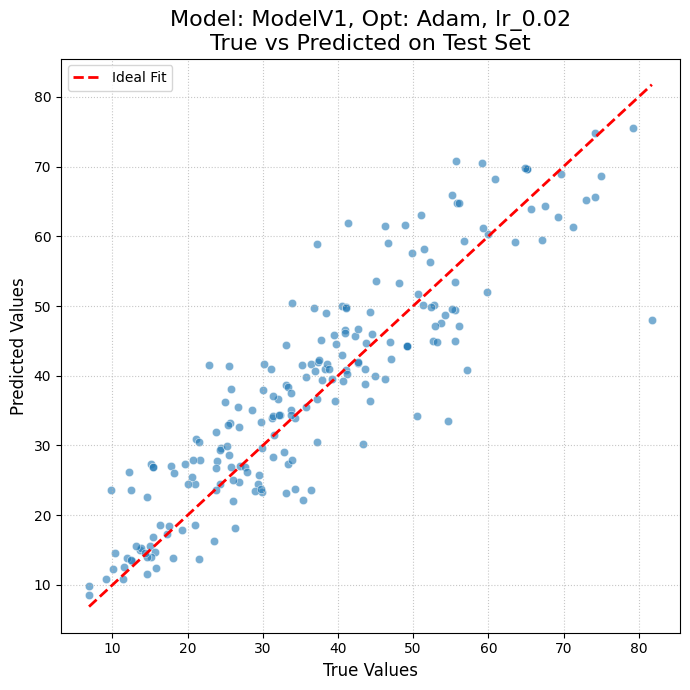

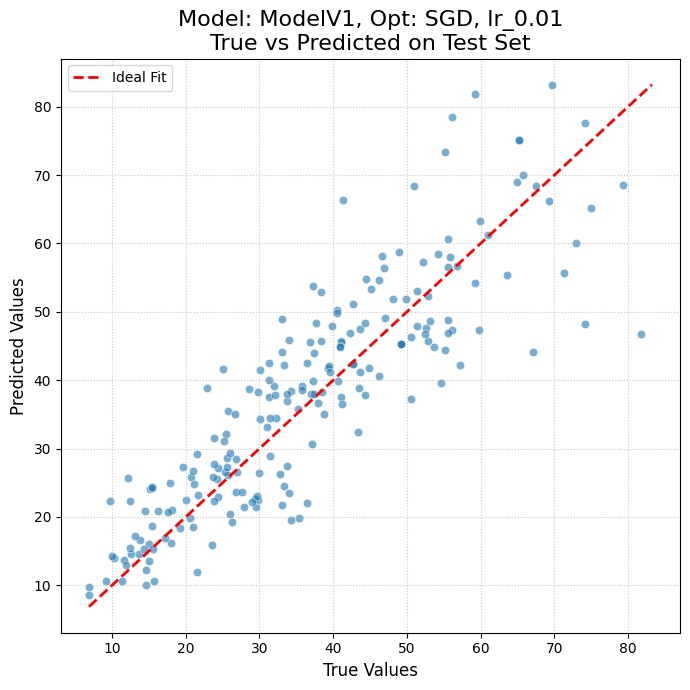

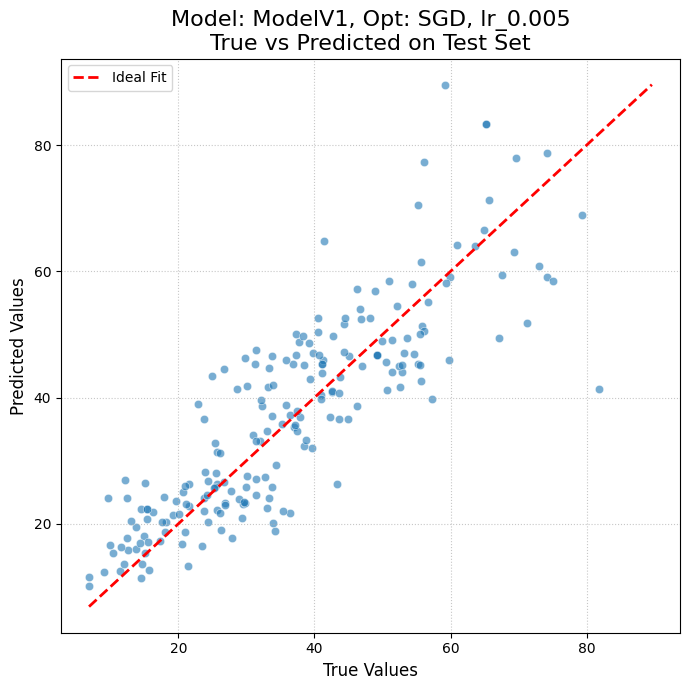

...

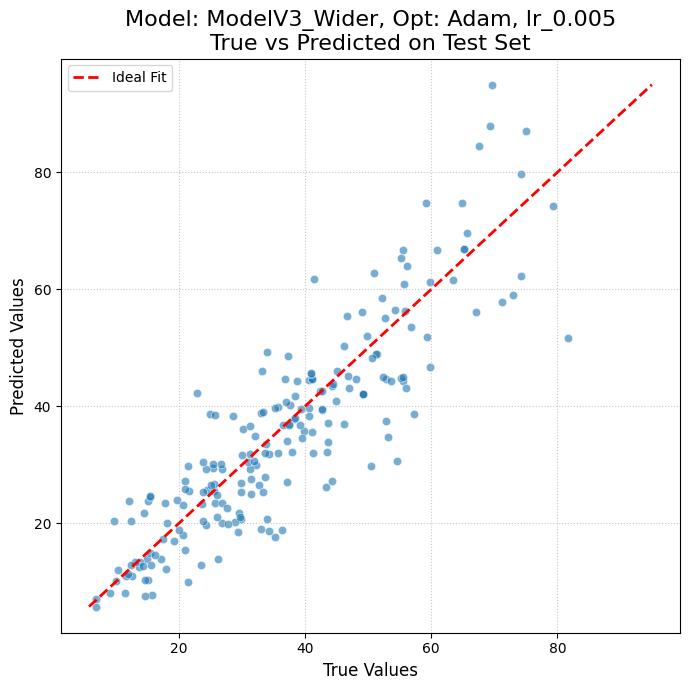

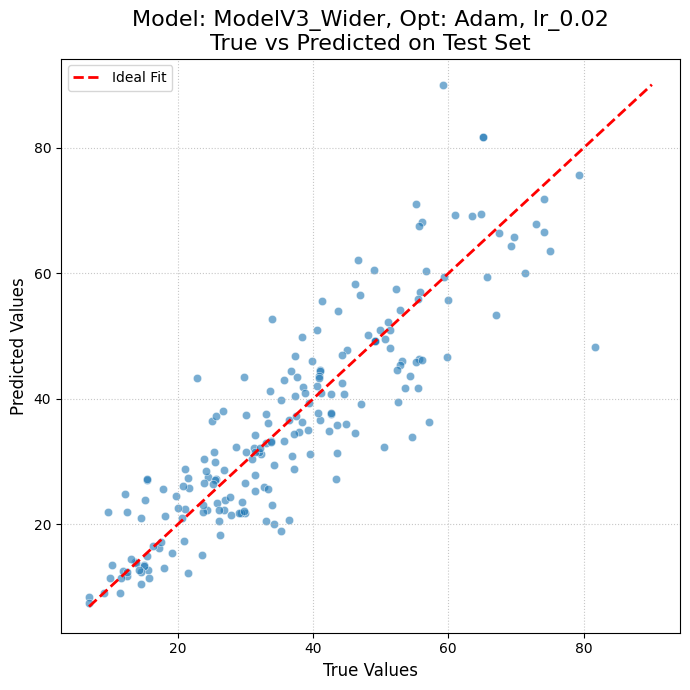

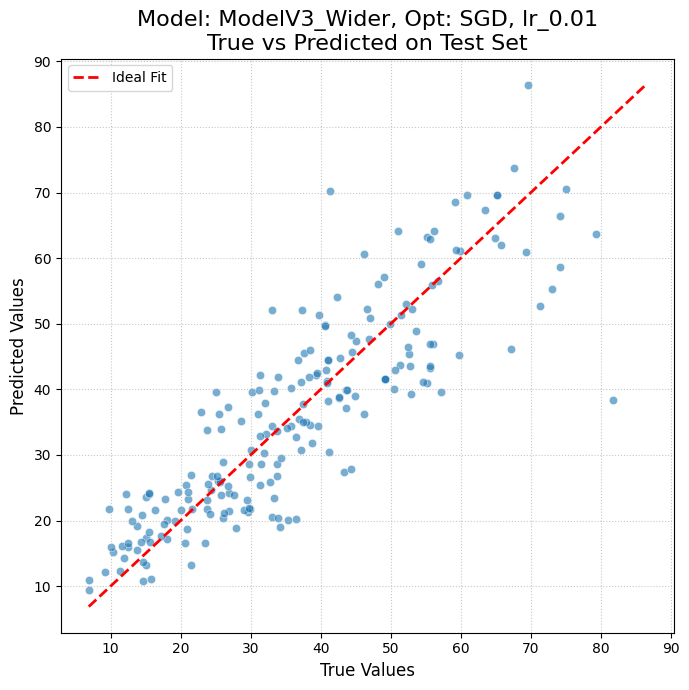

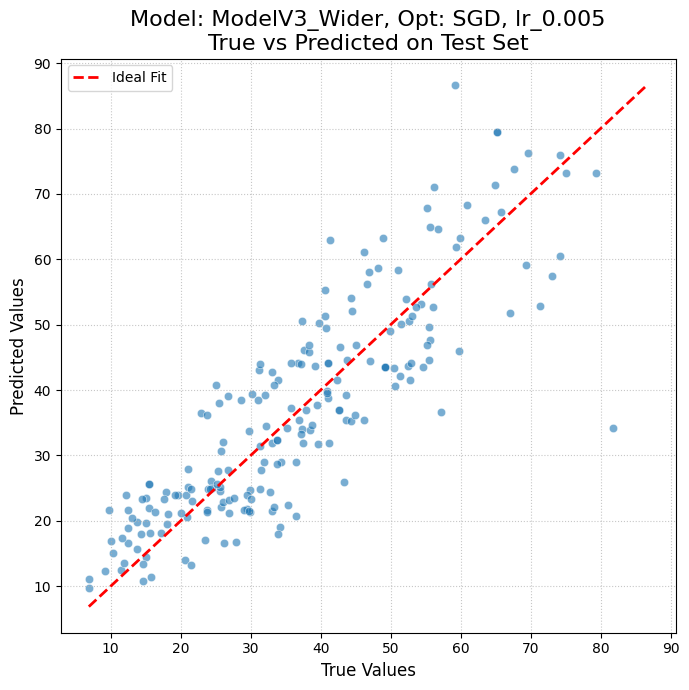

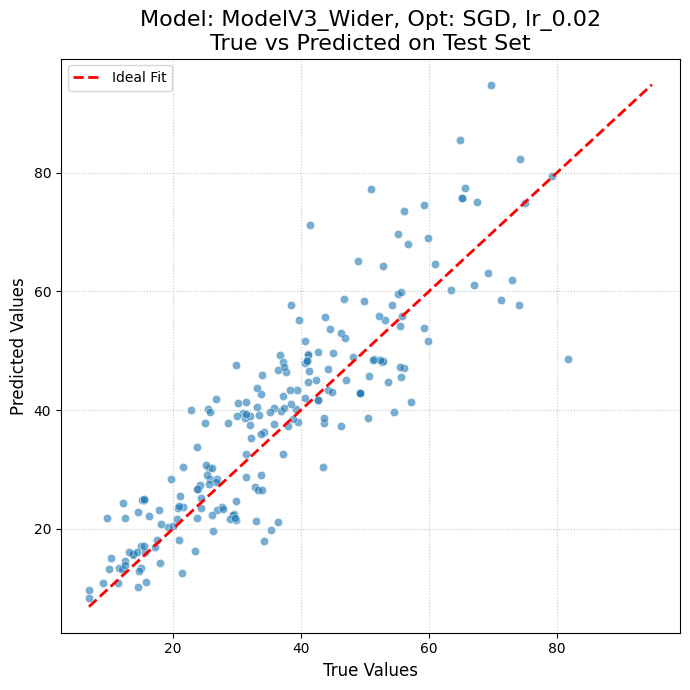

--- Plot Generation Complete ---


In [36]:
formatted_data_for_plotting = {}

if evaluated_models_data:
    print(f"\nReformatting {len(evaluated_models_data)} entries for plotting...")
    for key, data_entry in evaluated_models_data.items():
        # Parse the key: "ModelName_Optimizer_lrLRValue"
        match = re.match(r"(ModelV1|ModelV2_Deeper|ModelV3_Wider)_(Adam|SGD)_lr(0\.\d+)", key)
        if not match:
            print(f"  Could not parse key: '{key}'. Skipping this entry for plotting.")
            continue

        model_name = match.group(1)
        opt_name = match.group(2)
        lr_val_str = match.group(3) # LR as string, e.g., "0.01"
        lr_key_for_plot = f"lr_{lr_val_str}" # e.g., "lr_0.01"

        if model_name not in formatted_data_for_plotting:
            formatted_data_for_plotting[model_name] = {}
        if opt_name not in formatted_data_for_plotting[model_name]:
            formatted_data_for_plotting[model_name][opt_name] = {}

        formatted_data_for_plotting[model_name][opt_name][lr_key_for_plot] = data_entry

    if formatted_data_for_plotting:
        # Call the plotting function with the reformatted data
        plot_all_experiment_results(formatted_data_for_plotting)
    else:
        print("No data was successfully reformatted for plotting.")
else:
    print("The 'evaluated_models_data' dictionary is empty. Nothing to plot.")